# Research Question: What is the relationship between parks and crime in San Francisco? How does the number of incidents reported relate to the number of parks in a neighborhood? What are the most frequent types of incidents reported in neighborhoods with the lowest amount of parks? Does seaonality and proximity to parks influence the number of incidents reported? 

In [1]:
# First, let's import all libraries that we will need
import pandas as pd
import geopandas as gpd
import contextily as ctx
import matplotlib.pyplot as plt
import osmnx as ox
import folium
import plotly.express as px
from sodapy import Socrata
from keplergl import KeplerGl

# Querying Data

## We want to get a sense of the incident report data before moving on to park data

In [2]:
# Query data from data.sf.gov.org using Socrata
# Since Larceny Theft is the most common and there's a 50,000 query limit we're going to extract that data as it's own dataset
client_crime = Socrata ("data.sfgov.org", None)
results_crime = client_crime.get("wg3w-h783",
                                limit=50000,
                                where= "incident_year = '2019' and incident_category IN ('Larceny Theft')"
                                )
df_crime_LT = pd.DataFrame.from_records(results_crime)
df_crime_LT.shape

(48882, 26)

### There are 48,881 Larceny Theft reports in 2019, just below the 50,000 query limit. Let's leave this dataset to just be Larceny Theft reports. 

In [4]:
# Check to make sure query worked for just Larceny Theft data
df_crime_LT['incident_category'].value_counts()

Larceny Theft    48882
Name: incident_category, dtype: int64

In [5]:
# Check to make sure query worked for just Larceny Theft data
df_crime_LT['incident_year'].value_counts()

2019    48882
Name: incident_year, dtype: int64

### Now lets see if we can lump all the other incident types into one dataframe that doesn't exceed the query limit. 

In [5]:
# Query data from data.sfgov.org API on all crime types of interest, excluding Larceny Theft
client_crime2 = Socrata ("data.sfgov.org", None)
results_crime2 = client_crime2.get("wg3w-h783",
                                limit=50000,
                                where= "incident_year = '2019' and incident_category IN ('Arson','Assault','Burglary','Sex Offense','Homicide','Motor Vehicle Theft','Robbery','Offences Against The Family and Children','Family Offenses','Vandalism','Rape','Weapons Offense')"
                                  )
df_crime_multiple = pd.DataFrame.from_records(results_crime2)
df_crime_multiple.shape

(25564, 26)

#### 25,564 incident reports, which is below the limit! Now lets see if the query pulled in the data we wanted. 

In [6]:
# Check that query brought in the data for the categories we wanted...success!
df_crime_multiple['incident_category'].value_counts()

Assault                8892
Burglary               6042
Motor Vehicle Theft    5389
Robbery                3455
Weapons Offense         777
Sex Offense             445
Arson                   313
Vandalism               198
Rape                     38
Homicide                 15
Name: incident_category, dtype: int64

In [7]:
# Check that query brought in data for just 2019
df_crime_multiple['incident_year'].value_counts()

2019    25564
Name: incident_year, dtype: int64

## Now lets combined these two dataframes into one, so we have them all in one place

In [8]:
# use the .append fucntion to combine the two dataframes
df_crime_combined = df_crime_LT.append(df_crime_multiple, ignore_index = True) 

In [9]:
# check to make sure nothing funky happened to the columns
df_crime_combined.sample(5)

,incident_datetime,incident_date,incident_time,incident_year,incident_day_of_week,report_datetime,row_id,incident_id,incident_number,cad_number,...,resolution,intersection,cnn,police_district,analysis_neighborhood,supervisor_district,latitude,longitude,point,filed_online
38638,2019-10-25T14:57:00.000,2019-10-25T00:00:00.000,14:57,2019,Friday,2019-10-25T22:30:00.000,86274106243,862741,190807720,192984520,...,Open or Active,STOCKTON ST \ OFARRELL ST,24902000,Tenderloin,Financial District/South Beach,3,37.786615346301794,-122.40639887891692,"{'latitude': '37.786615346301794', 'longitude'...",NaN
44270,2019-12-04T18:20:00.000,2019-12-04T00:00:00.000,18:20,2019,Wednesday,2019-12-04T23:25:00.000,87773306244,877733,196260619,NaN,...,Open or Active,32ND AVE \ CLEMENT ST,27855000,Richmond,Outer Richmond,1,37.78167665394315,-122.49237515789692,"{'latitude': '37.78167665394315', 'longitude':...",True
71801,2019-11-26T04:40:00.000,2019-11-26T00:00:00.000,04:40,2019,Tuesday,2019-11-26T04:41:00.000,87499803072,874998,190893672,193300349,...,Cite or Arrest Adult,22ND ST \ MISSION ST,24111000,Mission,Mission,9,37.75543693568604,-122.41874757531652,"{'latitude': '37.75543693568604', 'longitude':...",NaN
22964,2019-07-11T14:10:00.000,2019-07-11T00:00:00.000,14:10,2019,Thursday,2019-07-11T16:02:00.000,82234306244,822343,196138301,NaN,...,Open or Active,LOMBARD ST \ SANSOME ST,24870000,Central,Financial District/South Beach,3,37.8040301248352,-122.40334871137732,"{'latitude': '37.8040301248352', 'longitude': ...",True
6015,2019-02-22T16:50:00.000,2019-02-22T00:00:00.000,16:50,2019,Friday,2019-02-22T21:17:00.000,77290206244,772902,190134448,190533708,...,Open or Active,STOCKTON ST \ NORTH POINT ST,25478000,Central,North Beach,3,37.80696290988273,-122.410497554147,"{'latitude': '37.80696290988273', 'longitude':...",NaN


In [10]:
# How large is our combined dataframe?
df_crime_combined.shape

(74446, 26)

In [11]:
# General info on our combined dataframe
df_crime_combined.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 74446 entries, 0 to 74445
Data columns (total 26 columns):
 #   Column                   Non-Null Count  Dtype 
---  ------                   --------------  ----- 
 0   incident_datetime        74446 non-null  object
 1   incident_date            74446 non-null  object
 2   incident_time            74446 non-null  object
 3   incident_year            74446 non-null  object
 4   incident_day_of_week     74446 non-null  object
 5   report_datetime          74446 non-null  object
 6   row_id                   74446 non-null  object
 7   incident_id              74446 non-null  object
 8   incident_number          74446 non-null  object
 9   cad_number               47966 non-null  object
 10  report_type_code         74446 non-null  object
 11  report_type_description  74446 non-null  object
 12  incident_code            74446 non-null  object
 13  incident_category        74446 non-null  object
 14  incident_subcategory     74446 non-nul

In [12]:
# Let's conver the latitude and longitudes into floats for future mapping purposes
df_crime_combined['latitude'] = df_crime_combined['latitude'].astype(float)
df_crime_combined['longitude'] = df_crime_combined['longitude'].astype(float)
df_crime_combined.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 74446 entries, 0 to 74445
Data columns (total 26 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   incident_datetime        74446 non-null  object 
 1   incident_date            74446 non-null  object 
 2   incident_time            74446 non-null  object 
 3   incident_year            74446 non-null  object 
 4   incident_day_of_week     74446 non-null  object 
 5   report_datetime          74446 non-null  object 
 6   row_id                   74446 non-null  object 
 7   incident_id              74446 non-null  object 
 8   incident_number          74446 non-null  object 
 9   cad_number               47966 non-null  object 
 10  report_type_code         74446 non-null  object 
 11  report_type_description  74446 non-null  object 
 12  incident_code            74446 non-null  object 
 13  incident_category        74446 non-null  object 
 14  incident_subcategory  

In [13]:
# Some descriptive stats on types of incidents
df_crime_combined['incident_category'].describe()

count             74446
unique               11
top       Larceny Theft
freq              48882
Name: incident_category, dtype: object

In [14]:
# Some descriptive stats on neighborhood
df_crime_combined['analysis_neighborhood'].describe()

count                              69402
unique                                42
top       Financial District/South Beach
freq                                7680
Name: analysis_neighborhood, dtype: object

In [15]:
# Some descriptive stats on date of incidents
df_crime_combined['incident_date'].describe()

count                       74446
unique                        365
top       2019-06-30T00:00:00.000
freq                          350
Name: incident_date, dtype: object

In [16]:
# First 10 rows
df_crime_combined.head(10)

,incident_datetime,incident_date,incident_time,incident_year,incident_day_of_week,report_datetime,row_id,incident_id,incident_number,cad_number,...,resolution,intersection,cnn,police_district,analysis_neighborhood,supervisor_district,latitude,longitude,point,filed_online
0,2019-11-08T10:44:00.000,2019-11-08T00:00:00.000,10:44,2019,Friday,2020-11-08T10:46:00.000,97656906363,976569,200674724,203131047,...,Cite or Arrest Adult,GEARY BLVD \ 16TH AVE,27487000,Richmond,Outer Richmond,1,37.780529,-122.475084,"{'latitude': '37.780528533424686', 'longitude'...",NaN
1,2019-01-01T12:00:00.000,2019-01-01T00:00:00.000,12:00,2019,Tuesday,2020-11-05T19:10:00.000,97586106381,975861,200669139,203102887,...,Open or Active,BRANNAN ST \ DELANCEY ST,23600000,Southern,Financial District/South Beach,6,37.783609,-122.389846,"{'latitude': '37.783609175905454', 'longitude'...",NaN
2,2019-01-01T00:00:00.000,2019-01-01T00:00:00.000,00:00,2019,Tuesday,2020-11-04T00:02:00.000,97595206372,975952,206154477,NaN,...,Open or Active,BERRY ST \ 05TH ST,23818000,Southern,Mission Bay,6,37.774031,-122.395577,"{'latitude': '37.77403085060099', 'longitude':...",True
3,2019-08-16T17:00:00.000,2019-08-16T00:00:00.000,17:00,2019,Friday,2020-01-31T15:17:00.000,97544306381,975443,200077930,200312404,...,Unfounded,UNION ST \ SCOTT ST,26873000,Northern,Marina,2,37.796461,-122.440422,"{'latitude': '37.79646144154291', 'longitude':...",NaN
4,2019-08-11T12:15:00.000,2019-08-11T00:00:00.000,12:15,2019,Sunday,2020-10-30T11:00:00.000,97397506364,973975,190588748,NaN,...,Cite or Arrest Adult,GEARY ST \ GRANT AVE,24655000,Central,Financial District/South Beach,3,37.787765,-122.405041,"{'latitude': '37.787765494696465', 'longitude'...",NaN
5,2019-07-03T14:00:00.000,2019-07-03T00:00:00.000,14:00,2019,Wednesday,2020-10-26T12:31:00.000,97286006374,972860,200646002,203001548,...,Open or Active,POLK ST \ CEDAR ST,25199000,Northern,Tenderloin,6,37.786359,-122.419833,"{'latitude': '37.786358950426', 'longitude': '...",NaN
6,2019-12-01T09:00:00.000,2019-12-01T00:00:00.000,09:00,2019,Sunday,2020-10-26T16:05:00.000,97292506374,972925,200647345,203002275,...,Open or Active,TURK ST \ STEINER ST,26048000,Northern,Western Addition,5,37.780287,-122.433785,"{'latitude': '37.780286693819114', 'longitude'...",NaN
7,2019-09-01T01:00:00.000,2019-09-01T00:00:00.000,01:00,2019,Sunday,2020-10-21T16:01:00.000,97252206374,972522,190684794,NaN,...,Open or Active,GOUGH ST \ HAIGHT ST \ MARKET ST,30753000,Southern,Hayes Valley,5,37.773036,-122.421941,"{'latitude': '37.77303605003146', 'longitude':...",True
8,2019-08-15T13:31:00.000,2019-08-15T00:00:00.000,13:31,2019,Thursday,2020-10-24T17:00:00.000,97230006360,972300,190600552,NaN,...,Cite or Arrest Adult,KEARNY ST \ MAIDEN LN,24648000,Central,Financial District/South Beach,3,37.788427,-122.403580,"{'latitude': '37.78842726061901', 'longitude':...",NaN
9,2019-10-22T08:00:00.000,2019-10-22T00:00:00.000,08:00,2019,Tuesday,2020-10-23T17:40:00.000,97207471013,972074,200640957,202972747,...,Open or Active,PHELPS ST \ CARROLL AVE,20618000,Bayview,Bayview Hunters Point,10,37.729211,-122.400834,"{'latitude': '37.72921143709946', 'longitude':...",NaN


In [17]:
# Last 10 rows
df_crime_combined.tail(10)

,incident_datetime,incident_date,incident_time,incident_year,incident_day_of_week,report_datetime,row_id,incident_id,incident_number,cad_number,...,resolution,intersection,cnn,police_district,analysis_neighborhood,supervisor_district,latitude,longitude,point,filed_online
74436,2019-11-05T12:39:00.000,2019-11-05T00:00:00.000,12:39,2019,Tuesday,2020-07-20T07:54:00.000,94541204014,945412,190034359,193091939,...,Open or Active,WISCONSIN ST \ 22ND ST,23705000,Bayview,Potrero Hill,10,37.757301,-122.398939,"{'latitude': '37.75730094770081', 'longitude':...",NaN
74437,2019-11-05T12:39:00.000,2019-11-05T00:00:00.000,12:39,2019,Tuesday,2020-07-20T07:54:00.000,94541204134,945412,190034359,193091939,...,Open or Active,WISCONSIN ST \ 22ND ST,23705000,Bayview,Potrero Hill,10,37.757301,-122.398939,"{'latitude': '37.75730094770081', 'longitude':...",NaN
74438,2019-06-28T15:00:00.000,2019-06-28T00:00:00.000,15:00,2019,Friday,2020-07-20T09:46:00.000,94546814020,945468,200433138,202020900,...,Cite or Arrest Adult,BOARDMAN PL \ BRYANT ST,23914000,Southern,South of Market,6,37.775161,-122.403636,"{'latitude': '37.7751608100771', 'longitude': ...",NaN
74439,2019-08-17T16:00:00.000,2019-08-17T00:00:00.000,16:00,2019,Saturday,2019-08-17T20:14:00.000,94549904138,945499,190607376,192293560,...,Cite or Arrest Adult,BLYTHDALE AVE \ BROOKDALE AVE,20431000,Bayview,Visitacion Valley,10,37.711317,-122.422241,"{'latitude': '37.71131669257075', 'longitude':...",NaN
74440,2019-09-14T21:18:00.000,2019-09-14T00:00:00.000,21:18,2019,Saturday,2019-09-14T21:18:00.000,94614312027,946143,190489992,191880014,...,Cite or Arrest Adult,04TH ST \ LONG BRIDGE ST,34168000,Out of SF,Mission Bay,6,37.773467,-122.391434,"{'latitude': '37.773466920607476', 'longitude'...",NaN
74441,2019-09-15T23:00:00.000,2019-09-15T00:00:00.000,23:00,2019,Sunday,2020-07-22T12:31:00.000,94614804012,946148,190696266,192603818,...,Open or Active,WHEAT ST \ PAUL AVE,20575000,Bayview,Bayview Hunters Point,10,37.723447,-122.400073,"{'latitude': '37.72344678051801', 'longitude':...",NaN
74442,2019-12-27T17:00:00.000,2019-12-27T00:00:00.000,17:00,2019,Friday,2020-07-27T18:05:00.000,94756203014,947562,200449812,202092578,...,Open or Active,GRANT AVE \ GREEN ST,25326000,Central,North Beach,3,37.799704,-122.407395,"{'latitude': '37.79970367508504', 'longitude':...",NaN
74443,2019-12-28T18:00:00.000,2019-12-28T00:00:00.000,18:00,2019,Saturday,2020-08-02T15:31:00.000,94929107023,949291,200462284,202151710,...,Open or Active,BEULAH ST \ COLE ST,26411000,Park,Haight Ashbury,5,37.767665,-122.450335,"{'latitude': '37.76766488028409', 'longitude':...",NaN
74444,2019-04-28T13:00:00.000,2019-04-28T00:00:00.000,13:00,2019,Sunday,2020-08-07T16:40:00.000,95081907026,950819,200473253,202202321,...,Open or Active,SANTIAGO ST \ 24TH AVE,23262000,Out of SF,Sunset/Parkside,4,37.744681,-122.481181,"{'latitude': '37.744681182378415', 'longitude'...",NaN
74445,2019-07-01T05:00:00.000,2019-07-01T00:00:00.000,05:00,2019,Monday,2020-08-10T09:43:00.000,95154807023,951548,190481459,NaN,...,Open or Active,INNES AVE \ EARL ST,20041000,Bayview,Bayview Hunters Point,10,37.729874,-122.372006,"{'latitude': '37.72987387412528', 'longitude':...",NaN


In [18]:
# Let's trim our dataframe to only have the columns we want
desired_columns = ['incident_datetime', 'incident_category','incident_date','incident_time','incident_year','incident_day_of_week','incident_id','analysis_neighborhood','latitude','longitude','point']
df_crime_combined = df_crime_combined[desired_columns]

In [19]:
df_crime_combined.head(5)

,incident_datetime,incident_category,incident_date,incident_time,incident_year,incident_day_of_week,incident_id,analysis_neighborhood,latitude,longitude,point
0,2019-11-08T10:44:00.000,Larceny Theft,2019-11-08T00:00:00.000,10:44,2019,Friday,976569,Outer Richmond,37.780529,-122.475084,"{'latitude': '37.780528533424686', 'longitude'..."
1,2019-01-01T12:00:00.000,Larceny Theft,2019-01-01T00:00:00.000,12:00,2019,Tuesday,975861,Financial District/South Beach,37.783609,-122.389846,"{'latitude': '37.783609175905454', 'longitude'..."
2,2019-01-01T00:00:00.000,Larceny Theft,2019-01-01T00:00:00.000,00:00,2019,Tuesday,975952,Mission Bay,37.774031,-122.395577,"{'latitude': '37.77403085060099', 'longitude':..."
3,2019-08-16T17:00:00.000,Larceny Theft,2019-08-16T00:00:00.000,17:00,2019,Friday,975443,Marina,37.796461,-122.440422,"{'latitude': '37.79646144154291', 'longitude':..."
4,2019-08-11T12:15:00.000,Larceny Theft,2019-08-11T00:00:00.000,12:15,2019,Sunday,973975,Financial District/South Beach,37.787765,-122.405041,"{'latitude': '37.787765494696465', 'longitude'..."


In [20]:
df_crime_combined.shape

(74446, 11)

### Now lets plot this incident report data!

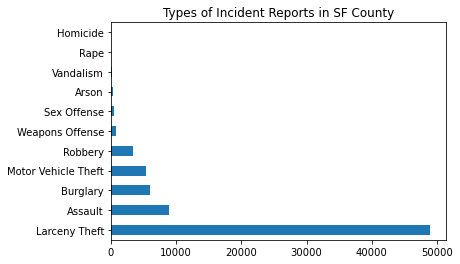

In [21]:
# Create a bar chart for the types of incidents and how many times each one was reported in 2019
df_crime_combined['incident_category'].value_counts().plot.barh(x='incident_category',y='count',title='Types of Incident Reports in SF County')

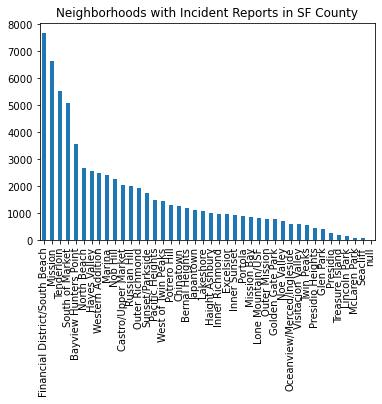

In [22]:
# Create a bar chart for the number of incidents reported in each neighborhood
df_crime_combined['analysis_neighborhood'].value_counts().plot.bar(x='analysis_neighborhood',y='count',title='Neighborhoods with Incident Reports in SF County')

## Now let's look at seasonality of the incident reports

In [23]:
# Trying to extract data for summer months
df_crime_combined.query('2019-06-01T00:00:00.000' <= 'incident_date' <= '2019-10-01T00:00:00.000')

ValueError: expr must be a string to be evaluated, <class 'bool'> given

### Trying to extract data for the summer season specifically. But there was an error with my syntax, so let's try another way. 

In [41]:
# Found this function online and it seems to work, or at least not return an error message
# Summer
df_crime_summer=df_crime_combined['incident_date'].between('2019-07-01T00:00:00.000','2019-10-01T00:00:00.000')
df_crime_summer=df_crime_combined[df_crime_summer]

In [42]:
# First five are within the time frame
df_crime_summer.head(5).reset_index()

,index,incident_datetime,incident_category,incident_date,incident_time,incident_year,incident_day_of_week,incident_id,analysis_neighborhood,latitude,longitude,point
0,3,2019-08-16T17:00:00.000,Larceny Theft,2019-08-16T00:00:00.000,17:00,2019,Friday,975443,Marina,37.796461,-122.440422,"{'latitude': '37.79646144154291', 'longitude':..."
1,4,2019-08-11T12:15:00.000,Larceny Theft,2019-08-11T00:00:00.000,12:15,2019,Sunday,973975,Financial District/South Beach,37.787765,-122.405041,"{'latitude': '37.787765494696465', 'longitude'..."
2,5,2019-07-03T14:00:00.000,Larceny Theft,2019-07-03T00:00:00.000,14:00,2019,Wednesday,972860,Tenderloin,37.786359,-122.419833,"{'latitude': '37.786358950426', 'longitude': '..."
3,7,2019-09-01T01:00:00.000,Larceny Theft,2019-09-01T00:00:00.000,01:00,2019,Sunday,972522,Hayes Valley,37.773036,-122.421941,"{'latitude': '37.77303605003146', 'longitude':..."
4,8,2019-08-15T13:31:00.000,Larceny Theft,2019-08-15T00:00:00.000,13:31,2019,Thursday,972300,Financial District/South Beach,37.788427,-122.403580,"{'latitude': '37.78842726061901', 'longitude':..."


### Now let's create dataframes for every season

In [43]:
# Fall
df_crime_fall=df_crime_combined['incident_date'].between('2019-10-01T00:00:00.000','2020-01-01T00:00:00.000')
df_crime_fall = df_crime_combined[df_crime_fall]

In [44]:
df_crime_fall.head(5).reset_index()

,index,incident_datetime,incident_category,incident_date,incident_time,incident_year,incident_day_of_week,incident_id,analysis_neighborhood,latitude,longitude,point
0,0,2019-11-08T10:44:00.000,Larceny Theft,2019-11-08T00:00:00.000,10:44,2019,Friday,976569,Outer Richmond,37.780529,-122.475084,"{'latitude': '37.780528533424686', 'longitude'..."
1,6,2019-12-01T09:00:00.000,Larceny Theft,2019-12-01T00:00:00.000,09:00,2019,Sunday,972925,Western Addition,37.780287,-122.433785,"{'latitude': '37.780286693819114', 'longitude'..."
2,9,2019-10-22T08:00:00.000,Larceny Theft,2019-10-22T00:00:00.000,08:00,2019,Tuesday,972074,Bayview Hunters Point,37.729211,-122.400834,"{'latitude': '37.72921143709946', 'longitude':..."
3,12,2019-11-29T19:40:00.000,Larceny Theft,2019-11-29T00:00:00.000,19:40,2019,Friday,971303,Financial District/South Beach,37.791899,-122.402571,"{'latitude': '37.79189893804923', 'longitude':..."
4,13,2019-10-01T21:30:00.000,Larceny Theft,2019-10-01T00:00:00.000,21:30,2019,Tuesday,969081,NaN,NaN,NaN,NaN


In [45]:
# Winter
df_crime_winter=df_crime_combined['incident_date'].between('2019-01-01T00:00:00.000','2019-04-01T00:00:00.000')
df_crime_winter = df_crime_combined[df_crime_winter]

In [46]:
df_crime_winter.head(5).reset_index()

,index,incident_datetime,incident_category,incident_date,incident_time,incident_year,incident_day_of_week,incident_id,analysis_neighborhood,latitude,longitude,point
0,1,2019-01-01T12:00:00.000,Larceny Theft,2019-01-01T00:00:00.000,12:00,2019,Tuesday,975861,Financial District/South Beach,37.783609,-122.389846,"{'latitude': '37.783609175905454', 'longitude'..."
1,2,2019-01-01T00:00:00.000,Larceny Theft,2019-01-01T00:00:00.000,00:00,2019,Tuesday,975952,Mission Bay,37.774031,-122.395577,"{'latitude': '37.77403085060099', 'longitude':..."
2,11,2019-01-01T12:00:00.000,Larceny Theft,2019-01-01T00:00:00.000,12:00,2019,Tuesday,971438,Bayview Hunters Point,37.729786,-122.391852,"{'latitude': '37.7297855541108', 'longitude': ..."
3,17,2019-03-14T13:00:00.000,Larceny Theft,2019-03-14T00:00:00.000,13:00,2019,Thursday,963716,Hayes Valley,37.773036,-122.421941,"{'latitude': '37.77303605003146', 'longitude':..."
4,18,2019-03-27T16:25:00.000,Larceny Theft,2019-03-27T00:00:00.000,16:25,2019,Wednesday,963747,Hayes Valley,37.773036,-122.421941,"{'latitude': '37.77303605003146', 'longitude':..."


In [47]:
# Spring
df_crime_spring=df_crime_combined['incident_date'].between('2019-04-01T00:00:00.000','2019-07-01T00:00:00.000')
df_crime_spring = df_crime_combined[df_crime_spring]

In [48]:
df_crime_spring.head(5).reset_index()

,index,incident_datetime,incident_category,incident_date,incident_time,incident_year,incident_day_of_week,incident_id,analysis_neighborhood,latitude,longitude,point
0,80,2019-04-01T19:30:00.000,Larceny Theft,2019-04-01T00:00:00.000,19:30,2019,Monday,786287,NaN,NaN,NaN,NaN
1,81,2019-04-03T16:30:00.000,Larceny Theft,2019-04-03T00:00:00.000,16:30,2019,Wednesday,786652,NaN,NaN,NaN,NaN
2,83,2019-04-06T03:01:00.000,Larceny Theft,2019-04-06T00:00:00.000,03:01,2019,Saturday,789229,NaN,NaN,NaN,NaN
3,84,2019-04-09T22:00:00.000,Larceny Theft,2019-04-09T00:00:00.000,22:00,2019,Tuesday,789610,NaN,NaN,NaN,NaN
4,85,2019-04-10T09:50:00.000,Larceny Theft,2019-04-10T00:00:00.000,09:50,2019,Wednesday,789630,NaN,NaN,NaN,NaN


### Let's visualize some of the trends within each seasonal dataframe

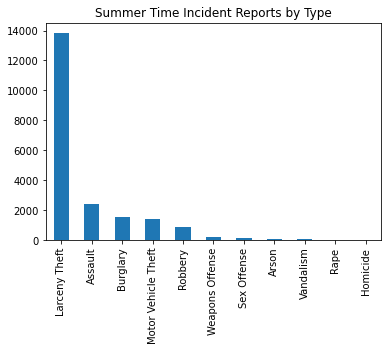

In [49]:
df_crime_summer['incident_category'].value_counts().plot.bar(x='incident_category',y='count', title='Summer Time Incident Reports by Type')

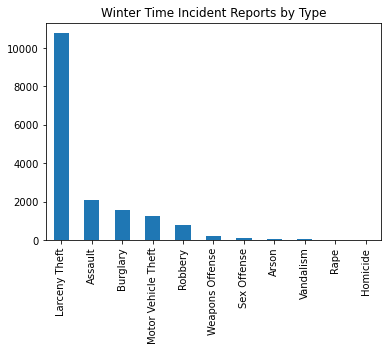

In [50]:
df_crime_winter['incident_category'].value_counts().plot.bar(x='incident_category',y='count', title='Winter Time Incident Reports by Type')

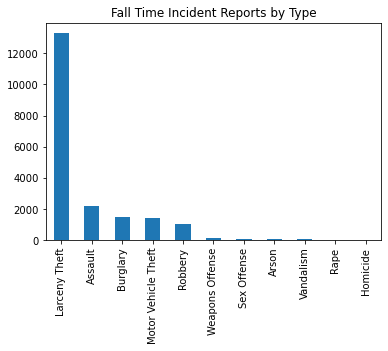

In [51]:
df_crime_fall['incident_category'].value_counts().plot.bar(x='incident_category',y='count', title='Fall Time Incident Reports by Type')

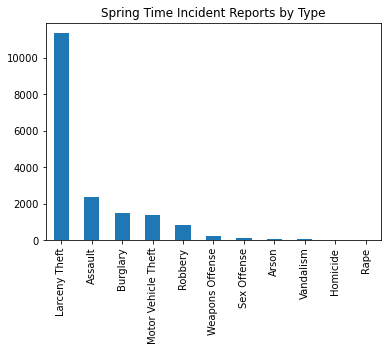

In [52]:
df_crime_spring['incident_category'].value_counts().plot.bar(x='incident_category',y='count', title='Spring Time Incident Reports by Type')

### Let's provide exact numbers for the frequency of each incident within each season

In [53]:
# Summer counts
df_crime_summer['incident_category'].value_counts()

Larceny Theft          13837
Assault                 2406
Burglary                1559
Motor Vehicle Theft     1389
Robbery                  891
Weapons Offense          220
Sex Offense              132
Arson                     90
Vandalism                 60
Rape                       7
Homicide                   1
Name: incident_category, dtype: int64

In [54]:
# Fall counts
df_crime_fall['incident_category'].value_counts()

Larceny Theft          13313
Assault                 2170
Burglary                1510
Motor Vehicle Theft     1434
Robbery                 1018
Weapons Offense          146
Sex Offense               94
Arson                     93
Vandalism                 51
Rape                      11
Homicide                   5
Name: incident_category, dtype: int64

In [55]:
# Winter counts
df_crime_winter['incident_category'].value_counts()

Larceny Theft          10780
Assault                 2073
Burglary                1543
Motor Vehicle Theft     1244
Robbery                  775
Weapons Offense          211
Sex Offense              104
Arson                     66
Vandalism                 39
Rape                      14
Homicide                   2
Name: incident_category, dtype: int64

In [56]:
# Spring counts
df_crime_spring['incident_category'].value_counts()

Larceny Theft          11354
Assault                 2333
Burglary                1487
Motor Vehicle Theft     1366
Robbery                  805
Weapons Offense          207
Sex Offense              119
Arson                     68
Vandalism                 49
Homicide                   7
Rape                       7
Name: incident_category, dtype: int64

### Let's create some interactive charts with the incident report data

In [57]:
# Summer
df_crime_summer_count=df_crime_summer.groupby(['incident_category','analysis_neighborhood'])['incident_id'].count().reset_index(name="count")
df_crime_summer_count.head(5)

,incident_category,analysis_neighborhood,count
0,Arson,Bayview Hunters Point,12
1,Arson,Bernal Heights,2
2,Arson,Castro/Upper Market,1
3,Arson,Chinatown,1
4,Arson,Financial District/South Beach,11


In [58]:
px.bar(df_crime_summer_count,
      x = 'analysis_neighborhood',
      y= 'count',
       color='incident_category',
      labels= {'incident_category': 'Type of Incident', 'count':'Count'},
      title = 'Types of Incidents in Summer 2019 by Neighborhood')

In [59]:
# Winter
df_crime_winter_count=df_crime_winter.groupby(['incident_category','analysis_neighborhood'])['incident_id'].count().reset_index(name="count")
df_crime_winter_count.head(5)

,incident_category,analysis_neighborhood,count
0,Arson,Bayview Hunters Point,9
1,Arson,Bernal Heights,2
2,Arson,Castro/Upper Market,1
3,Arson,Chinatown,3
4,Arson,Excelsior,2


In [60]:
px.bar(df_crime_winter_count,
      x = 'analysis_neighborhood',
      y= 'count',
       color='incident_category',
      labels= {'incident_category': 'Type of Incident', 'count':'Count'},
      title = 'Types of Incidents in Winter 2019 by Neighborhood')

In [61]:
# Fall
df_crime_fall_count=df_crime_fall.groupby(['incident_category','analysis_neighborhood'])['incident_id'].count().reset_index(name="count")
df_crime_fall_count.head(5)

,incident_category,analysis_neighborhood,count
0,Arson,Bayview Hunters Point,13
1,Arson,Castro/Upper Market,3
2,Arson,Chinatown,7
3,Arson,Excelsior,2
4,Arson,Financial District/South Beach,11


In [62]:
px.bar(df_crime_fall_count,
      x = 'analysis_neighborhood',
      y= 'count',
       color='incident_category',
      labels= {'incident_category': 'Type of Incident', 'count':'Count'},
      title = 'Types of Incidents in Fall 2019 by Neighborhood')

In [63]:
# Spring
df_crime_spring_count=df_crime_spring.groupby(['incident_category','analysis_neighborhood'])['incident_id'].count().reset_index(name="count")
df_crime_spring_count.head(5)

,incident_category,analysis_neighborhood,count
0,Arson,Bayview Hunters Point,13
1,Arson,Castro/Upper Market,3
2,Arson,Chinatown,5
3,Arson,Financial District/South Beach,4
4,Arson,Hayes Valley,2


In [64]:
px.bar(df_crime_spring_count,
      x = 'analysis_neighborhood',
      y= 'count',
       color='incident_category',
      labels= {'incident_category': 'Type of Incident', 'count':'Count'},
      title = 'Types of Incidents in Spring 2019 by Neighborhood')

## Let's pivot to looking deeper at data on incident date and incident types.

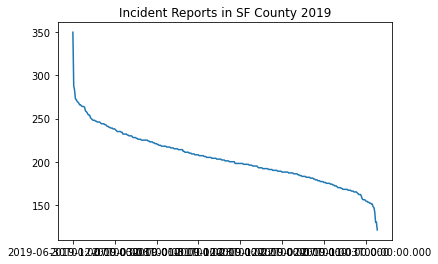

In [65]:
# Not sure what's happening with the x-axis here...
df_crime_combined['incident_date'].value_counts().plot.line(x='incident_date',y='count',title='Incident Reports in SF County 2019')

In [66]:
df_crime_combined_date=df_crime_combined.groupby(['incident_date','analysis_neighborhood'])['incident_id'].count().reset_index(name="count")
df_crime_combined_date.head(5)

,incident_date,analysis_neighborhood,count
0,2019-01-01T00:00:00.000,Bayview Hunters Point,11
1,2019-01-01T00:00:00.000,Bernal Heights,3
2,2019-01-01T00:00:00.000,Castro/Upper Market,5
3,2019-01-01T00:00:00.000,Chinatown,4
4,2019-01-01T00:00:00.000,Excelsior,1


In [67]:
# Create a line graph that represents the date of incidents in SF county
# Need to figure out how to save a plotly chart
px.line(df_crime_combined_date,
      x='incident_date',
       y='count',
      title='Number of Incident Reports in SF County by Date in 2019',
      labels={'analysis_neighborhood':'Neighborhood','count':'Count','incident_date':'Date of Incident'})

In [68]:
# Create a line graph that reprsents the date of incidents in each neighborhood in SF county
# Need to figure out how to save a plotly chart
px.line(df_crime_combined_date,
      x='incident_date',
       y='count',
        color='analysis_neighborhood',
      title='Number of Incident Reports per Neighborhood in SF County by Date in 2019',
      labels={'analysis_neighborhood':'Neighborhood','count':'Count','incident_date':'Date of Incident'})

In [69]:
df_crime_combined_cat=df_crime_combined.groupby(['incident_category','analysis_neighborhood'])['incident_id'].count().reset_index(name="count")
df_crime_combined_cat.head(5)

,incident_category,analysis_neighborhood,count
0,Arson,Bayview Hunters Point,47
1,Arson,Bernal Heights,4
2,Arson,Castro/Upper Market,8
3,Arson,Chinatown,15
4,Arson,Excelsior,4


In [70]:
# Create a line graph that reprsents the date of incidents in each neighborhood in SF county
# Need to figure out how to save a plotly chart
px.line(df_crime_combined_cat,
      x='incident_category',
       y='count',
        color='analysis_neighborhood',
      title='Type of Incident Reports per Neighborhood in SF County in 2019',
      labels={'analysis_neighborhood':'Neighborhood','count':'Count','incident_category':'Type of Incident'})

In [71]:
# Create a bar graph that reprsents the date of incidents in each neighborhood in SF county
# Need to figure out how to save a plotly chart
px.bar(df_crime_combined_cat,
      x='incident_category',
       y='count',
        color='analysis_neighborhood',
      title='Type of Incident Reports per Neighborhood in SF County in 2019',
      labels={'analysis_neighborhood':'Neighborhood','count':'Count','incident_category':'Type of Incident'})

In [72]:
# Create a bar graph that represents the type of incidents in each neighborhood in SF county
# Need to figure out how to save a plotly chart
px.bar(df_crime_combined_cat,
      x='analysis_neighborhood',
       y='count',
        color='incident_category',
      title='Type of Incident Reports per Neighborhood in SF County in 2019',
      labels={'analysis_neighborhood':'Neighborhood','count':'Count','incident_category':'Type of Incident'})

In [73]:
df_crime_combined_dot=df_crime_combined.groupby(['incident_day_of_week','incident_category'])['incident_id'].count().reset_index(name="count")
df_crime_combined_dot.head(5)

,incident_day_of_week,incident_category,count
0,Friday,Arson,55
1,Friday,Assault,1272
2,Friday,Burglary,968
3,Friday,Homicide,1
4,Friday,Larceny Theft,7800


In [74]:
# Create a bar graph that represents the type of incidents for each day of the week in SF county
# Need to figure out how to save a plotly chart
px.bar(df_crime_combined_dot,
      x='incident_day_of_week',
       y='count',
        color='incident_category',
      title='Type of Incident Reports for Each Day of the Week in SF County in 2019',
      labels={'incident_day_of_week':'Day of the Week','count':'Count','incident_category':'Type of Incident'})

In [75]:
# Create a bar graph that reprsents the type of incidents for each day of the week in SF county
# Need to figure out how to save a plotly chart
px.bar(df_crime_combined_dot,
      x='incident_category',
       y='count',
        color='incident_day_of_week',
      title='Type of Incident Reports by Day of the Week Incident Was Reported in SF County in 2019',
      labels={'incident_day_of_week':'Day of the Week','count':'Count','incident_category':'Type of Incident'})

# Now that we have a good understanding of the incident report data, let's take a look at San Francisco recreation and park data
## Importing the Park Data
### San Francisco Recreation and Parks Properties - The data includes land owned and/or maintained by the SF Recreation and Parks Department. 

# Getting a First Look at the Data

In [3]:
# This is data for San Francisco Recreation and Park Spaces
park = gpd.read_file('Recreation_and_Parks_Properties.csv')

In [4]:
# checking the data type
type(park)

geopandas.geodataframe.GeoDataFrame

In [5]:
# checking the first 5 rows
park.head()

,OBJECTID,Map_Label,Longitude,Latitude,Acres,TMA_PropertyID,GlobalID,created_user,created_date,last_edited_user,...,GGP_Section,State_Senate,MONS_Neighborhood,Police_District,US_Congress,Realtor_Neighborhood,State_Assembly,Planning_Neighborhood,shape,geometry
0,1,Maritime Plaza,-122.39982015,37.7955308,2.01276398,142,{C7DDE53A-9636-451E-AB81-6CD8EA8064BB},rpdgis,20130524085732,RPDGIS@RPDGIS.SFGOV.ORG,...,,11th Senatorial District,Financial District,Central,12th Congressional District,Financial District/Barbary Coast,17th Assembly District,Financial District,MULTIPOLYGON (((-122.39907987164456 37.7959623...,None
1,3,Lake Merced Park,-122.49239745,37.7219234,608.4860977,10,{293E53D2-335E-437A-91F0-542BA621ED4A},rpdgis,20130524085732,RPDGIS@RPDGIS.SFGOV.ORG,...,,11th Senatorial District,Lakeshore,Taraval,14th Congressional District,Lake Shore,19th Assembly District,Lakeshore,MULTIPOLYGON (((-122.48623678253473 37.7081573...,None
2,6,Broadway Tunnel West Mini Park,-122.41742016,37.79642235,0.14897279,203,{28E5A0C5-4251-467C-B590-683B55DB2E03},rpdgis,20130524085732,RPDGIS@RPDGIS.SFGOV.ORG,...,,11th Senatorial District,Russian Hill,Central,12th Congressional District,Nob Hill,17th Assembly District,Russian Hill,MULTIPOLYGON (((-122.41757140658545 37.7964861...,None
3,7,Mt. Davidson Park,-122.45465821,37.73906281,40.71180762,69,{6E125179-0B3B-4200-916A-1C98FF73A92A},rpdgis,20130524085732,RPDGIS@RPDGIS.SFGOV.ORG,...,,11th Senatorial District,Miraloma Park,Ingleside,12th Congressional District,Miraloma Park,17th Assembly District,West of Twin Peaks,MULTIPOLYGON (((-122.45308566253199 37.7409742...,None
4,8,Union Square,-122.40750049,37.78793123,2.59970898,135,{2B838818-7C4B-4841-8001-ACCB5B3B5469},rpdgis,20130524085732,RPDGIS@RPDGIS.SFGOV.ORG,...,,11th Senatorial District,Downtown / Union Square,Central,12th Congressional District,Downtown,17th Assembly District,Downtown/Civic Center,MULTIPOLYGON (((-122.40672169413945 37.7876472...,None


In [6]:
# checking the last 5 rows
park.tail()

,OBJECTID,Map_Label,Longitude,Latitude,Acres,TMA_PropertyID,GlobalID,created_user,created_date,last_edited_user,...,GGP_Section,State_Senate,MONS_Neighborhood,Police_District,US_Congress,Realtor_Neighborhood,State_Assembly,Planning_Neighborhood,shape,geometry
231,8900,West Portal Playground,-122.46507086,37.74183309,1.30952382,68,{339697C4-A5C0-4CCC-AFC8-72D54CE44459},RPDGIS@RPDGIS.SFGOV.ORG,20170501232222,RPDGIS@RPDGIS.SFGOV.ORG,...,,11th Senatorial District,West Portal,Taraval,14th Congressional District,West Portal,19th Assembly District,West of Twin Peaks,MULTIPOLYGON (((-122.46511111642486 37.7413897...,None
232,8920,Youngblood-Coleman Playground,-122.38448964,37.73876902,6.4453776,45,{EBDB17A8-019D-4A91-AED1-046DCA182C32},RPDGIS@RPDGIS.SFGOV.ORG,20170501234259,RPDGIS@RPDGIS.SFGOV.ORG,...,,11th Senatorial District,Bayview,Bayview,12th Congressional District,Bayview,17th Assembly District,Bayview,MULTIPOLYGON (((-122.38338682589244 37.7390534...,None
233,8998,Head & Brotherood Mini Park,-122.46421929,37.71262615,0.51954167,196,{154947F4-7DEF-44AF-9524-CE9211E93672},RPDGIS@RPDGIS.SFGOV.ORG,20170508224401,RPDGIS@RPDGIS.SFGOV.ORG,...,,11th Senatorial District,Merced Heights,Taraval,14th Congressional District,Ingleside Heights,19th Assembly District,Ocean View,MULTIPOLYGON (((-122.46370735801966 37.7124178...,None
234,10598,Telegraph Hill - Pioneer Park,-122.40620398,37.8019919,4.81997339,149,{8F51A6B8-FFE0-43C0-AB64-31C3F9516B21},MMARTIN@RPDGIS.SFGOV.ORG,20170807222342,RPDGIS@RPDGIS.SFGOV.ORG,...,,11th Senatorial District,Telegraph Hill,Central,12th Congressional District,Telegraph Hill,17th Assembly District,North Beach,MULTIPOLYGON (((-122.40655169721774 37.8026066...,None
235,10599,James Rolph Jr. Playground,-122.40623124,37.74972741,2.92946699,50,{9E6D5A09-C738-4118-9544-ECE3117617BB},RPDGIS@RPDGIS.SFGOV.ORG,20170803224040,RPDGIS@RPDGIS.SFGOV.ORG,...,,11th Senatorial District,Mission,Mission,12th Congressional District,Inner Mission,17th Assembly District,Mission,MULTIPOLYGON (((-122.40574763036555 37.7491591...,None


In [7]:
# Let's look at a random row as a sample
park.sample()

,OBJECTID,Map_Label,Longitude,Latitude,Acres,TMA_PropertyID,GlobalID,created_user,created_date,last_edited_user,...,GGP_Section,State_Senate,MONS_Neighborhood,Police_District,US_Congress,Realtor_Neighborhood,State_Assembly,Planning_Neighborhood,shape,geometry
227,8839,Portola Open Space,-122.44405944,37.74707418,0.81189211,37264,{37C3729F-BB7E-4380-8A24-338627384418},RPDGIS@RPDGIS.SFGOV.ORG,20170501222351,RPDGIS@RPDGIS.SFGOV.ORG,...,,11th Senatorial District,Upper Market,Mission,12th Congressional District,Diamond Heights,17th Assembly District,Noe Valley,MULTIPOLYGON (((-122.44413869860603 37.7468067...,None


# Taking a look at the columns

In [8]:
# Looking at the data types for each column
park.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 236 entries, 0 to 235
Data columns (total 33 columns):
 #   Column                 Non-Null Count  Dtype   
---  ------                 --------------  -----   
 0   OBJECTID               236 non-null    object  
 1   Map_Label              236 non-null    object  
 2   Longitude              236 non-null    object  
 3   Latitude               236 non-null    object  
 4   Acres                  236 non-null    object  
 5   TMA_PropertyID         236 non-null    object  
 6   GlobalID               236 non-null    object  
 7   created_user           236 non-null    object  
 8   created_date           236 non-null    object  
 9   last_edited_user       236 non-null    object  
 10  last_edited_date       236 non-null    object  
 11  SquareFeet             236 non-null    object  
 12  PerimeterLength        236 non-null    object  
 13  PropertyType           236 non-null    object  
 14  Address                236 non-nul

In [9]:
# How many rows and columns?
park.shape

(236, 33)

In [10]:
# Looking at the column titles
park.columns.to_list()

['OBJECTID',
 'Map_Label',
 'Longitude',
 'Latitude',
 'Acres',
 'TMA_PropertyID',
 'GlobalID',
 'created_user',
 'created_date',
 'last_edited_user',
 'last_edited_date',
 'SquareFeet',
 'PerimeterLength',
 'PropertyType',
 'Address',
 'City',
 'State',
 'Zipcode',
 'Complex',
 'PSA',
 'SupDist',
 'Ownership',
 'Land_ID',
 'GGP_Section',
 'State_Senate',
 'MONS_Neighborhood',
 'Police_District',
 'US_Congress',
 'Realtor_Neighborhood',
 'State_Assembly',
 'Planning_Neighborhood',
 'shape',
 'geometry']

In [11]:
# Let's see how many properties are in each neighborhood
park['Planning_Neighborhood'].value_counts()

Western Addition         19
Mission                  16
Bernal Heights           15
Bayview                  14
Outer Mission            11
Castro/Upper Market      11
Russian Hill              9
Downtown/Civic Center     9
Noe Valley                9
Lakeshore                 8
Inner Richmond            8
West of Twin Peaks        7
Inner Sunset              7
Potrero Hill              7
Ocean View                6
Nob Hill                  6
Outer Richmond            5
South of Market           5
Golden Gate Park          5
Haight Ashbury            5
Glen Park                 5
Parkside                  5
Marina                    5
Visitacion Valley         5
Diamond Heights           4
North Beach               4
Excelsior                 4
Chinatown                 3
Financial District        3
Pacific Heights           3
Presidio Heights          2
Seacliff                  2
Twin Peaks                2
Outer Sunset              2
Crocker Amazon            2
                    

In [12]:
# Let's see the counts for each property type
park['PropertyType'].value_counts()

Neighborhood Park or Playground                 134
Mini Park                                        44
Regional Park                                    18
Community Garden                                 15
Civic Plaza or Square                            10
SF Public Library property                        7
Real Estate/Administrative Services property      2
Parkway                                           2
Family Camp                                       1
Concession                                        1
Zoological Garden                                 1
War Memorial & Performing Arts Center             1
Name: PropertyType, dtype: int64

In [13]:
# Let's see how many properties are in each police district
park['Police_District'].value_counts()

Ingleside     48
Taraval       34
Bayview       25
Central       25
Mission       24
Northern      23
Park          22
Richmond      21
Southern       7
Tenderloin     4
               2
INGLESIDE      1
Name: Police_District, dtype: int64

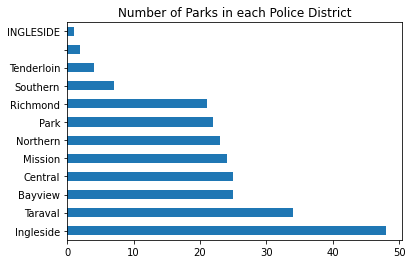

In [14]:
# Wanted to make a chart showing how many parks are in each Police District
# Not sure how to get rid of the blank and INGLESIDE categories
park['Police_District'].value_counts().plot.barh(x="Police District",y="Count",
                                                title="Number of Parks in each Police District")

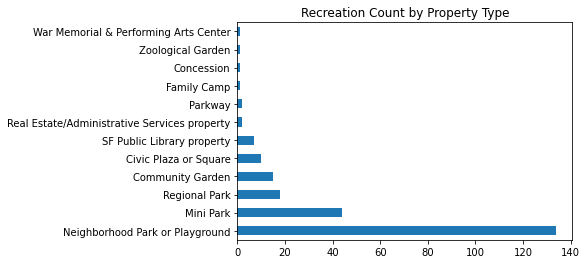

In [15]:
# Wanted to make a chart showing the count of each property type
# We see that Neighborhood Park or Playground, Mini Park, and Regional Park are the most frequent property type
# and they are the most relevant to us so we will isolate those later on
park['PropertyType'].value_counts().plot.barh(title="Recreation Count by Property Type")

### Now I will get rid of some of the columns I don't need.

In [16]:
desired_columns = ['OBJECTID',
 'Map_Label',
 'Longitude',
 'Latitude',
 'Acres',
 'SquareFeet',
 'PerimeterLength',
 'PropertyType',
 'Address',
 'City',
 'State',
 'Zipcode',
 'Complex',
 'SupDist',
 'Ownership',
 'MONS_Neighborhood',
 'Police_District',
 'Realtor_Neighborhood',
 'Planning_Neighborhood',
 'shape',
 'geometry']

In [17]:
park_trimmed = park[desired_columns]
park_trimmed

,OBJECTID,Map_Label,Longitude,Latitude,Acres,SquareFeet,PerimeterLength,PropertyType,Address,City,...,Zipcode,Complex,SupDist,Ownership,MONS_Neighborhood,Police_District,Realtor_Neighborhood,Planning_Neighborhood,shape,geometry
0,1,Maritime Plaza,-122.39982015,37.7955308,2.01276398,87675.99885853,87675.99885853,Civic Plaza or Square,285 Washington Street,San Francisco,...,94111,North Beach Complex,3,Real Estate,Financial District,Central,Financial District/Barbary Coast,Financial District,MULTIPOLYGON (((-122.39907987164456 37.7959623...,None
1,3,Lake Merced Park,-122.49239745,37.7219234,608.4860977,26505654.42121903,26505654.42121903,Regional Park,Lake Merced Boulevard,San Francisco,...,94132,Lake Merced Complex,7,PUC/Clean Water Program,Lakeshore,Taraval,Lake Shore,Lakeshore,MULTIPOLYGON (((-122.48623678253473 37.7081573...,None
2,6,Broadway Tunnel West Mini Park,-122.41742016,37.79642235,0.14897279,6489.2547279,6489.2547279,Mini Park,1201 Broadway,San Francisco,...,94109,North Beach Complex,3,Public Works,Russian Hill,Central,Nob Hill,Russian Hill,MULTIPOLYGON (((-122.41757140658545 37.7964861...,None
3,7,Mt. Davidson Park,-122.45465821,37.73906281,40.71180762,1773406.32935865,1773406.32935865,Regional Park,Myra Way,San Francisco,...,94127,Lake Merced Complex,7,Recreation & Park,Miraloma Park,Ingleside,Miraloma Park,West of Twin Peaks,MULTIPOLYGON (((-122.45308566253199 37.7409742...,None
4,8,Union Square,-122.40750049,37.78793123,2.59970898,113243.32434104,113243.32434104,Civic Plaza or Square,Post & Stockton,San Francisco,...,94108,Civic Center/Potrero Hill Complex,3,Recreation & Park,Downtown / Union Square,Central,Downtown,Downtown/Civic Center,MULTIPOLYGON (((-122.40672169413945 37.7876472...,None
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
231,8900,West Portal Playground,-122.46507086,37.74183309,1.30952382,57042.85874534,57042.85874534,Neighborhood Park or Playground,Ulloa & Lenox Streets,San Francisco,...,94127,Lake Merced Complex,7,Recreation & Park,West Portal,Taraval,West Portal,West of Twin Peaks,MULTIPOLYGON (((-122.46511111642486 37.7413897...,None
232,8920,Youngblood-Coleman Playground,-122.38448964,37.73876902,6.4453776,280760.64752792,280760.64752792,Neighborhood Park or Playground,1398 Hudson Street,San Francisco,...,94124,Bayview/Palega Complex,10,Recreation & Park,Bayview,Bayview,Bayview,Bayview,MULTIPOLYGON (((-122.38338682589244 37.7390534...,None
233,8998,Head & Brotherood Mini Park,-122.46421929,37.71262615,0.51954167,22631.2376498,22631.2376498,Mini Park,Head Street & Brotherhood Way,San Francisco,...,94132,Lake Merced Complex,11,Public Works,Merced Heights,Taraval,Ingleside Heights,Ocean View,MULTIPOLYGON (((-122.46370735801966 37.7124178...,None
234,10598,Telegraph Hill - Pioneer Park,-122.40620398,37.8019919,4.81997339,209915.57112574,209915.57112574,Civic Plaza or Square,Telegraph Hill Boulevard,San Francisco,...,94133,North Beach Complex,3,Recreation & Park,Telegraph Hill,Central,Telegraph Hill,North Beach,MULTIPOLYGON (((-122.40655169721774 37.8026066...,None


In [18]:
# Looking at just those properties that are neighborhood parks or playgrounds and saving the new dataframe
park_neighborhoodparks = park_trimmed[park_trimmed.PropertyType == 'Neighborhood Park or Playground']
park_neighborhoodparks

,OBJECTID,Map_Label,Longitude,Latitude,Acres,SquareFeet,PerimeterLength,PropertyType,Address,City,...,Zipcode,Complex,SupDist,Ownership,MONS_Neighborhood,Police_District,Realtor_Neighborhood,Planning_Neighborhood,shape,geometry
5,9,Precita Park,-122.41204637,37.74706105,2.24601118,97836.24218973,97836.24218973,Neighborhood Park or Playground,3200 Folsom Street,San Francisco,...,94110,Bernal/St. Mary's Complex,9,Recreation & Park,Bernal Heights,Ingleside,Bernal Heights,Bernal Heights,MULTIPOLYGON (((-122.41327441815201 37.7468197...,None
9,14,Louis Sutter Playground,-122.4139202,37.72247455,14.34169671,624724.30477121,624724.30477121,Neighborhood Park or Playground,Wayland & University,San Francisco,...,94134,McLaren/Crocker Complex,9,Recreation & Park,McLaren Park,Bayview,Portola,Excelsior,MULTIPOLYGON (((-122.41256615847489 37.7227195...,None
11,16,Diamond & Farnum Open Space,-122.43431342,37.73880227,0.07941013,3459.10725366,3459.10725366,Neighborhood Park or Playground,Diamond & Farnum,San Francisco,...,94131,Glen Park Complex,8,Recreation & Park,Glen Park,Ingleside,Glen Park,Glen Park,MULTIPOLYGON (((-122.43446629079187 37.7387608...,None
12,17,Cow Hollow Playground,-122.44485143,37.79733829,0.14946255,6510.58816092,6510.58816092,Neighborhood Park or Playground,1 Miley St,San Francisco,...,94123,Marina Complex,2,Recreation & Park,Cow Hollow,Northern,Cow Hollow,Marina,MULTIPOLYGON (((-122.44503532373197 37.7973571...,None
14,19,Herz Playground,-122.41658008,37.71347574,6.80124104,296262.05679892,296262.05679892,Neighborhood Park or Playground,Hahn & Visitacion,San Francisco,...,94134,McLaren/Crocker Complex,10,Recreation & Park,McLaren Park,Ingleside,Visitacion Valley,Visitacion Valley,MULTIPOLYGON (((-122.41767014041079 37.7135115...,None
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
229,8872,Sue Bierman Park,-122.39751884,37.79577739,4.4721156,194805.34309802,194805.34309802,Neighborhood Park or Playground,Clay Street & The Embarcadero,San Francisco,...,94111,North Beach Complex,3,Recreation & Park,Financial District,Central,Financial District/Barbary Coast,Financial District,MULTIPOLYGON (((-122.39729188021285 37.7959962...,None
230,8878,Sunnyside Playground,-122.44746419,37.73366439,2.60130724,113312.94313497,113312.94313497,Neighborhood Park or Playground,233 Melrose Avenue,San Francisco,...,94127,Glen Park Complex,7,PUC/Clean Water Program,Sunnyside,Ingleside,Sunnyside,Outer Mission,MULTIPOLYGON (((-122.44827922345725 37.7342249...,None
231,8900,West Portal Playground,-122.46507086,37.74183309,1.30952382,57042.85874534,57042.85874534,Neighborhood Park or Playground,Ulloa & Lenox Streets,San Francisco,...,94127,Lake Merced Complex,7,Recreation & Park,West Portal,Taraval,West Portal,West of Twin Peaks,MULTIPOLYGON (((-122.46511111642486 37.7413897...,None
232,8920,Youngblood-Coleman Playground,-122.38448964,37.73876902,6.4453776,280760.64752792,280760.64752792,Neighborhood Park or Playground,1398 Hudson Street,San Francisco,...,94124,Bayview/Palega Complex,10,Recreation & Park,Bayview,Bayview,Bayview,Bayview,MULTIPOLYGON (((-122.38338682589244 37.7390534...,None


In [19]:
# Looking at just those properties that are regional parks and saving the new dataframe
park_regional = park_trimmed[park_trimmed.PropertyType == 'Regional Park']
park_regional

,OBJECTID,Map_Label,Longitude,Latitude,Acres,SquareFeet,PerimeterLength,PropertyType,Address,City,...,Zipcode,Complex,SupDist,Ownership,MONS_Neighborhood,Police_District,Realtor_Neighborhood,Planning_Neighborhood,shape,geometry
1,3,Lake Merced Park,-122.49239745,37.7219234,608.4860977,26505654.42121903,26505654.42121903,Regional Park,Lake Merced Boulevard,San Francisco,...,94132,Lake Merced Complex,7,PUC/Clean Water Program,Lakeshore,Taraval,Lake Shore,Lakeshore,MULTIPOLYGON (((-122.48623678253473 37.7081573...,None
3,7,Mt. Davidson Park,-122.45465821,37.73906281,40.71180762,1773406.32935865,1773406.32935865,Regional Park,Myra Way,San Francisco,...,94127,Lake Merced Complex,7,Recreation & Park,Miraloma Park,Ingleside,Miraloma Park,West of Twin Peaks,MULTIPOLYGON (((-122.45308566253199 37.7409742...,None
6,10,John McLaren Park,-122.4190781,37.71808411,312.53540111,13614042.06931684,13614042.06931684,Regional Park,Mansell & Visitacion,San Francisco,...,94134,McLaren/Crocker Complex,11,Recreation & Park,Crocker Amazon,Bayview,Excelsior,Excelsior,MULTIPOLYGON (((-122.41546306139335 37.7133934...,None
23,30,Twin Peaks,-122.4469545,37.75234399,54.58819904,2377861.95640328,2377861.95640328,Regional Park,Twin Peaks Boulevard,San Francisco,...,94131,Glen Park Complex,8,Fire,Clarendon Heights,Park,Clarendon Heights,Twin Peaks,MULTIPOLYGON (((-122.44459535002889 37.7563893...,None
44,56,Sharp Park,-122.47497421,37.62395214,409.69084993,17846133.40641851,17846133.40641851,Regional Park,Route 1 & Sharp Park Rd,Pacifica,...,94044,Sharp Park Complex,Outside SF,Recreation & Park,,,,,MULTIPOLYGON (((-122.47843552419718 37.6270998...,None
51,64,Glen Canyon Park,-122.44266629,37.74020594,77.93628414,3394904.52732998,3394904.52732998,Regional Park,Elk Street & O'Shaughnessy Blvd,San Francisco,...,94127,Glen Park Complex,8,Recreation & Park,Diamond Heights,Ingleside,Diamond Heights,Outer Mission,MULTIPOLYGON (((-122.44441143469008 37.7430314...,None
54,67,Lincoln Park,-122.49831499,37.78423976,112.80451526,4913764.68623183,4913764.68623183,Regional Park,34th Avenue & Clement,San Francisco,...,94121,Richmond Complex,1,Recreation & Park,Seacliff,Richmond,Lincoln Park,Seacliff,MULTIPOLYGON (((-122.50059655401378 37.7861019...,None
56,71,Bay View Park,-122.39250136,37.71517987,46.63450454,2031399.00740282,2031399.00740282,Regional Park,LeConte Avenue,San Francisco,...,94124,Bayview/Palega Complex,10,Recreation & Park,Candlestick Point SRA,Bayview,Candlestick Point,Bayview,MULTIPOLYGON (((-122.39442278676913 37.7184877...,None
92,112,Yacht Harbor and Marina Green,-122.44117884,37.80795776,165.44583006,7206820.35007809,7206820.35007809,Regional Park,Marina Boulevard,San Francisco,...,94123,Marina Complex,2,Recreation & Park,Presidio National Park,Northern,Marina,Marina,MULTIPOLYGON (((-122.4367734836825 37.81116830...,None
114,139,Sigmund Stern Recreation Grove,-122.47828163,37.73609308,34.76818953,1514502.33247866,1514502.33247866,Regional Park,19th Avenue & Sloat Boulevard,San Francisco,...,94132,Stern Grove Complex,4,Recreation & Park,Parkside,Taraval,Inner Parkside,Lakeshore,MULTIPOLYGON (((-122.47529515869348 37.7348168...,None


In [20]:
# Looking at just those properties that are mini parks and saving the new dataframe
park_mini = park_trimmed[park_trimmed.PropertyType == 'Mini Park']
park_mini

,OBJECTID,Map_Label,Longitude,Latitude,Acres,SquareFeet,PerimeterLength,PropertyType,Address,City,...,Zipcode,Complex,SupDist,Ownership,MONS_Neighborhood,Police_District,Realtor_Neighborhood,Planning_Neighborhood,shape,geometry
2,6,Broadway Tunnel West Mini Park,-122.41742016,37.79642235,0.14897279,6489.2547279,6489.2547279,Mini Park,1201 Broadway,San Francisco,...,94109,North Beach Complex,3,Public Works,Russian Hill,Central,Nob Hill,Russian Hill,MULTIPOLYGON (((-122.41757140658545 37.7964861...,None
7,12,Mullen & Peralta Mini Park,-122.40880709,37.74607639,0.45038527,19618.77719044,19618.77719044,Mini Park,Mullen & Peralta,San Francisco,...,94110,Bernal/St. Mary's Complex,9,Public Works,Peralta Heights,Ingleside,Bernal Heights,Bernal Heights,MULTIPOLYGON (((-122.40899400322316 37.7463341...,None
10,15,Geneva Community Garden,-122.44544775,37.72044197,0.2934504,12782.70879409,12782.70879409,Mini Park,600 Geneva & Delano,San Francisco,...,94112,Glen Park Complex,11,Recreation & Park,Cayuga,Ingleside,Mission Terrace,Outer Mission,MULTIPOLYGON (((-122.44514469471297 37.7202370...,None
13,18,Coso & Precita Mini Park,-122.41812033,37.74624354,0.15048622,6555.17547189,6555.17547189,Mini Park,Coso & Precita,San Francisco,...,94110,Bernal/St. Mary's Complex,9,Recreation & Park,Bernal Heights,Ingleside,Bernal Heights,Bernal Heights,MULTIPOLYGON (((-122.41794208573371 37.7460295...,None
22,29,Lakeview & Ashton Mini Park,-122.46257271,37.71809145,0.51484395,22426.60058509,22426.60058509,Mini Park,Ashton & Lakeview Streets,San Francisco,...,94132,Lake Merced Complex,11,Recreation & Park,Ingleside,Taraval,Ingleside Heights,Ocean View,MULTIPOLYGON (((-122.46274287264507 37.7180026...,None
36,46,Lessing & Sears Mini Park,-122.45532293,37.70861819,0.16883586,7354.49061121,7354.49061121,Mini Park,Sickles & Sears,San Francisco,...,94112,Bayview/Palega Complex,11,Recreation & Park,Outer Mission,Ingleside,Outer Mission,Outer Mission,MULTIPOLYGON (((-122.45524078263472 37.7084469...,None
46,59,Joost & Baden Mini Park,-122.4408417,37.7327328,0.14133386,6156.50549517,6156.50549517,Mini Park,Joost & West of Baden,San Francisco,...,94131,Glen Park Complex,8,PUC/Clean Water Program,Sunnyside,Ingleside,Sunnyside,Outer Mission,MULTIPOLYGON (((-122.44079002161361 37.7324241...,None
68,87,24th & York Mini Park,-122.40857387,37.753044,0.13315132,5800.06998092,5800.06998092,Mini Park,24th & York Streets,San Francisco,...,94110,Mission Complex,9,Recreation & Park,Mission,Mission,Inner Mission,Mission,MULTIPOLYGON (((-122.40847248647871 37.7528903...,None
76,95,Potrero Hill Mini Park,-122.3966542,37.75739557,0.22468105,9787.10714327,9787.10714327,Mini Park,22nd Street & Connecticut,San Francisco,...,94107,Civic Center/Potrero Hill Complex,10,Recreation & Park,Potrero Hill,Bayview,Potrero Hill,Potrero Hill,MULTIPOLYGON (((-122.39685772599105 37.7573352...,None
80,99,Beideman & O'Farrell Mini Park,-122.43859838,37.78240439,0.08771836,3821.01075951,3821.01075951,Mini Park,O'Farrell & Beideman,San Francisco,...,94115,Western Addition Complex,5,Recreation & Park,Western Addition,Park,Western Addition,Western Addition,MULTIPOLYGON (((-122.43867803193247 37.7823212...,None


In [21]:
# Wanted to make a better looking chart of property types
# Cannot figure out how to get these in ascending order 
px.bar(park, y=('PropertyType'), 
       title='Number of Recreation Spaces by Property Type in San Francisco',
       labels={'PropertyType':'Property Type','count':'Count'})

# Now that we have a good understanding of the incident report and park data, let's get mapping!

### First, convert every incident report dataframe into a GeoDataFrame.

In [22]:
crime_combined_gdf = gpd.GeoDataFrame(
    df_crime_combined, geometry=gpd.points_from_xy(df_crime_combined.longitude, df_crime_combined.latitude))
crime_summer_gdf = gpd.GeoDataFrame(
    df_crime_summer, geometry=gpd.points_from_xy(df_crime_summer.longitude, df_crime_summer.latitude))
crime_fall_gdf = gpd.GeoDataFrame(
    df_crime_fall, geometry=gpd.points_from_xy(df_crime_fall.longitude, df_crime_fall.latitude))
crime_winter_gdf = gpd.GeoDataFrame(
    df_crime_winter, geometry=gpd.points_from_xy(df_crime_winter.longitude, df_crime_winter.latitude))
crime_spring_gdf = gpd.GeoDataFrame(
    df_crime_spring, geometry=gpd.points_from_xy(df_crime_spring.longitude, df_crime_spring.latitude))

NameError: name 'df_crime_combined' is not defined

### Start plotting incident reports

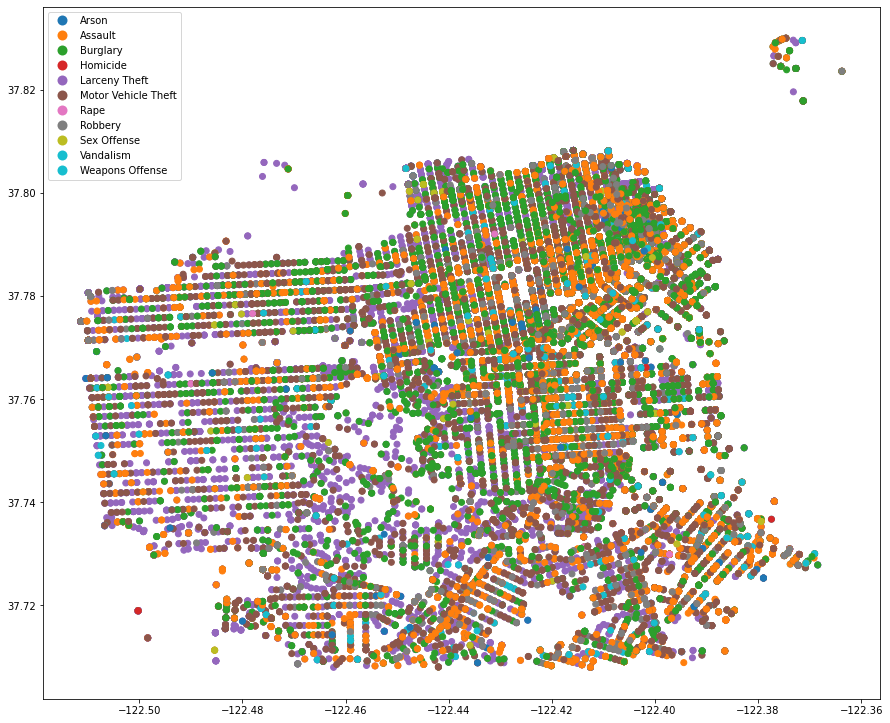

In [96]:
ax = crime_combined_gdf.plot(figsize=(15,15),
                            column='incident_category',
                            legend=True)
# How can we add a title?

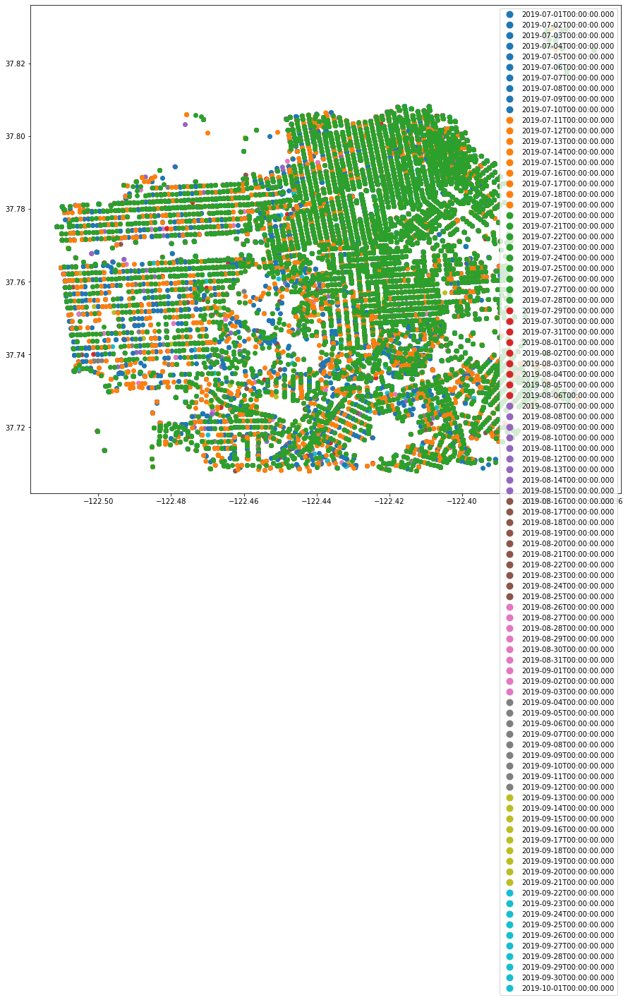

In [97]:
# Use subplot function to create multiple data layers
# This one turned out funky
fig, ax = plt.subplots(figsize=(15, 15))
crime_summer_gdf.plot(ax=ax, column='incident_date', legend=True)
crime_fall_gdf.plot(ax=ax)
crime_winter_gdf.plot(ax=ax)
crime_spring_gdf.plot(ax=ax)

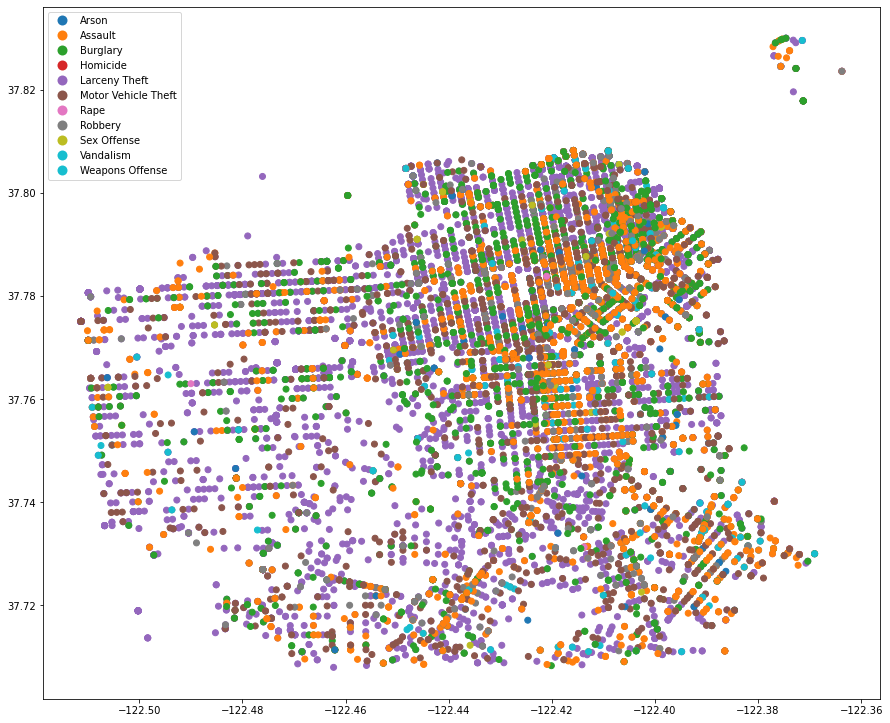

In [98]:
# Summer
ax = crime_summer_gdf.plot(figsize=(15,15),
                            column='incident_category',
                            legend=True)

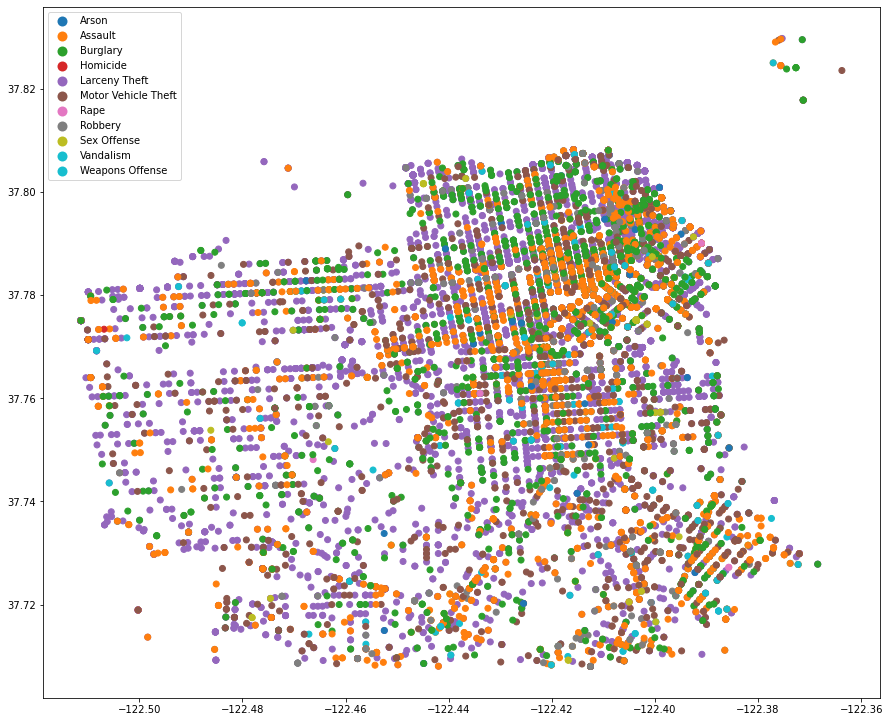

In [99]:
# Winter
ax = crime_winter_gdf.plot(figsize=(15,15),
                            column='incident_category',
                            legend=True)

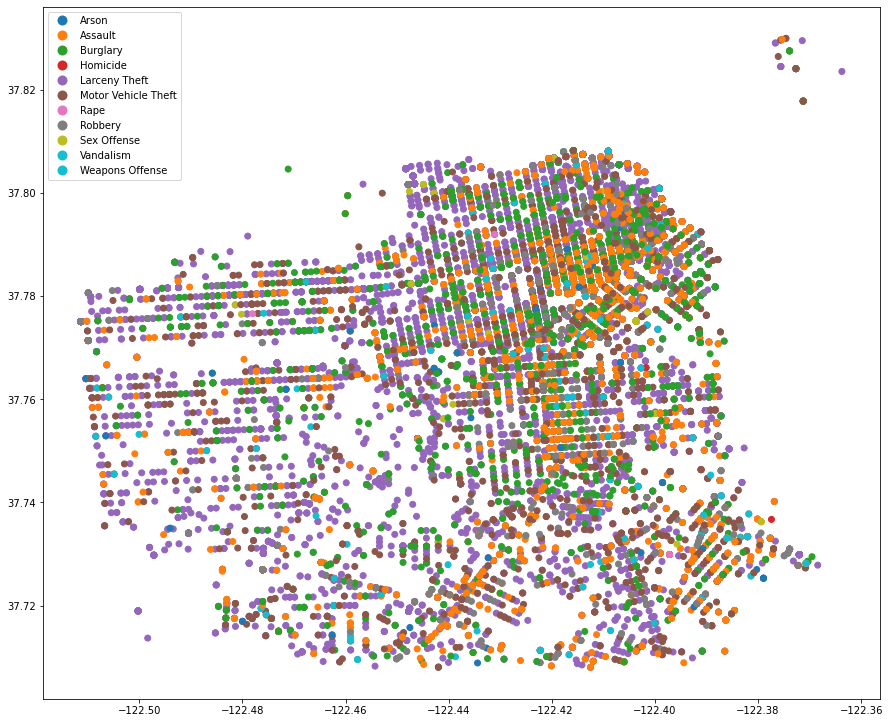

In [100]:
ax = crime_fall_gdf.plot(figsize=(15,15),
                            column='incident_category',
                            legend=True)

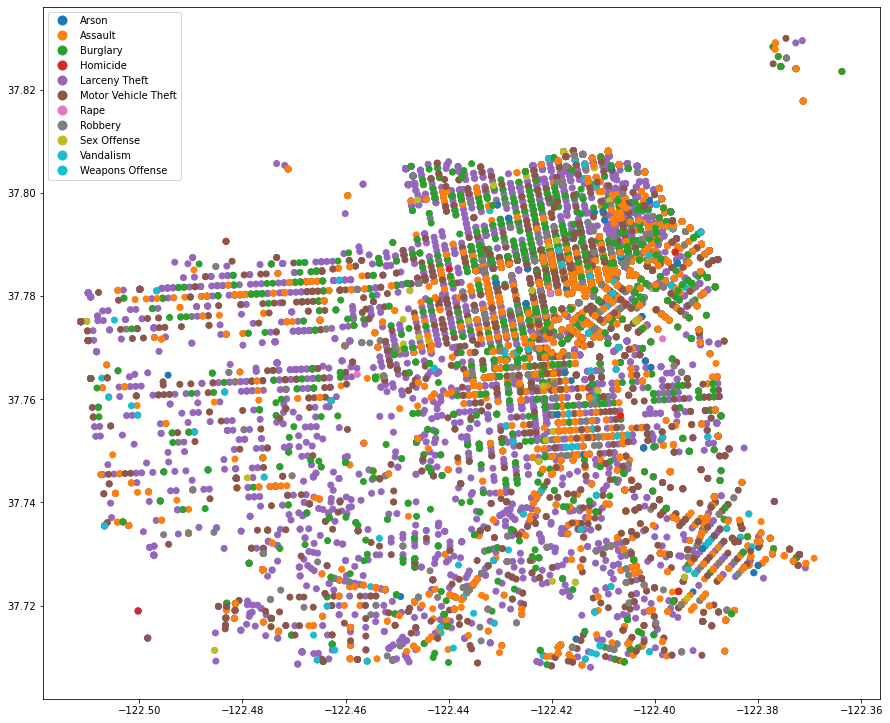

In [101]:
# Spring
ax = crime_spring_gdf.plot(figsize=(15,15),
                            column='incident_category',
                            legend=True)

In [28]:
# Plot by Day of the Week
ax = crime_combined_gdf.plot(figsize=(15,15),
                            column='incident_day_of_week',
                            legend=True)

NameError: name 'crime_combined_gdf' is not defined

# These incident report scatterplots show us a lot. Now, let's explore parks on Open Street Maps
### We wanted to start out the mapping for parks by taking a look at Open Street Maps version of recreation data

In [29]:
address = 'San Francisco, California'

In [30]:
%%time

osm = ox.geometries_from_address(address,tags={'leisure':True},dist=1000)

CPU times: user 185 ms, sys: 7.47 ms, total: 192 ms
Wall time: 5.11 s


In [31]:
list(osm)

['unique_id',
 'osmid',
 'element_type',
 'addr:housenumber',
 'addr:street',
 'brand',
 'brand:wikidata',
 'brand:wikipedia',
 'leisure',
 'name',
 'geometry',
 'wheelchair',
 'source',
 'website',
 'addr:postcode',
 'opening_hours',
 'phone',
 'access',
 'addr:city',
 'fixme',
 'payment:notes',
 'material',
 'level',
 'sport',
 'telephone',
 'nodes',
 'courts',
 'lit',
 'addr:state',
 'alt_name',
 'amenity',
 'building',
 'ele',
 'gnis:county_name',
 'height',
 'wikidata',
 'wikipedia',
 'name:ko',
 'emergency',
 'created_by',
 'area',
 'addr:country',
 'gnis:county_id',
 'gnis:created',
 'gnis:feature_id',
 'gnis:state_id',
 'verified',
 'public',
 'surface',
 'building:levels',
 'building:part',
 'hoops',
 'operator',
 'wikimedia_commons',
 'description',
 'note',
 'location',
 'garden:type']

## Exploring "Leisure" on Open Street Maps

In [32]:
columns_to_keep = ['geometry','leisure']
osm = osm[columns_to_keep]
osm.sample(10)

,geometry,leisure
28,"POLYGON ((-122.41487 37.78048, -122.41484 37.7...",common
90,"POLYGON ((-122.41543 37.78473, -122.41544 37.7...",pitch
81,"POLYGON ((-122.42751 37.78075, -122.42746 37.7...",playground
94,"POLYGON ((-122.41527 37.78500, -122.41525 37.7...",pitch
43,"POLYGON ((-122.41609 37.78264, -122.41596 37.7...",park
88,"POLYGON ((-122.42369 37.78524, -122.42368 37.7...",playground
15,POINT (-122.42865 37.78584),fitness_centre
72,"POLYGON ((-122.41913 37.77138, -122.41912 37.7...",park
89,"POLYGON ((-122.41538 37.78484, -122.41539 37.7...",pitch
116,"POLYGON ((-122.42189 37.78219, -122.42177 37.7...",pitch


In [33]:
osm_leisure = osm.leisure.value_counts()
osm_leisure

pitch               33
garden              25
park                18
playground          18
fitness_centre       8
common               6
parklet              4
sports_centre        2
sauna                2
stadium              1
amusement_arcade     1
dog_park             1
swimming_pool        1
spa                  1
picnic_table         1
fitness_station      1
Name: leisure, dtype: int64

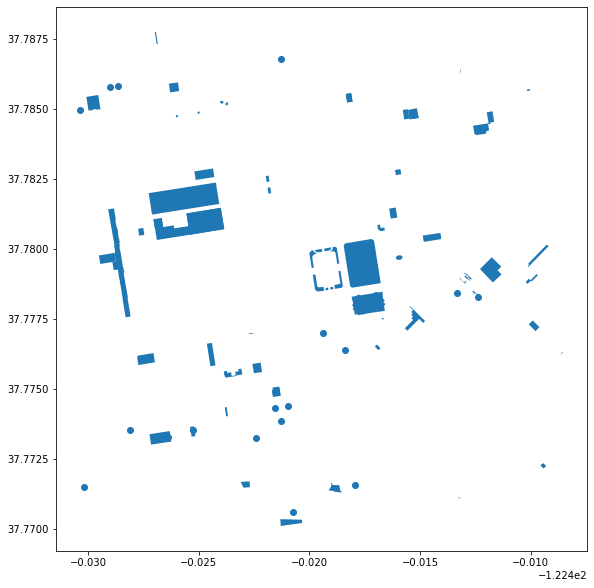

In [34]:
# Mapping the different leisure spaces
ax = osm.plot(figsize=(10,10))

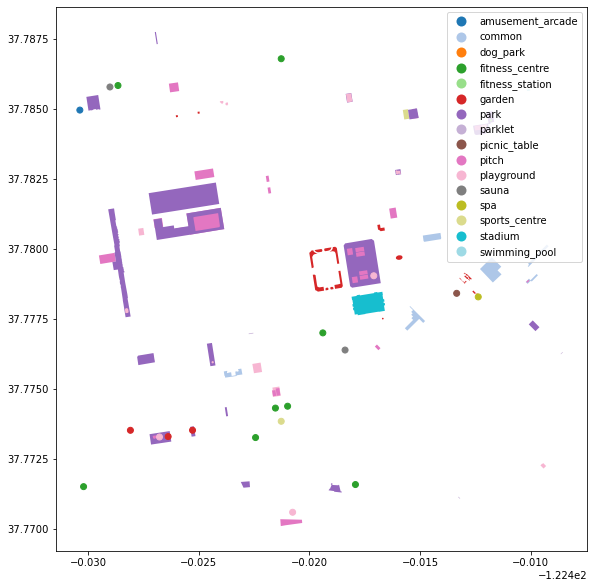

In [35]:
# changing the colors
ax = osm.plot(figsize=(10,10),
         column='leisure',
         cmap='tab20',
         legend=True)

(-122.431466355, -122.407445545, 37.76921828999999, 37.78864011)

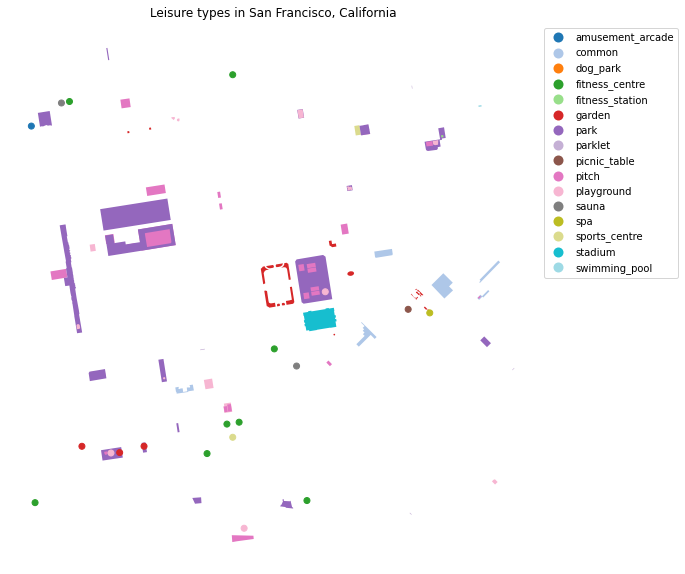

In [36]:
# Moving the legend to make it look nicer
ax = osm.plot(figsize=(10,10),
         column='leisure',
         cmap='tab20',
         legend=True,
         legend_kwds={'loc':'upper left','bbox_to_anchor':(1,1)})


ax.set_title('Leisure types in ' + address)

ax.axis('off')

In [37]:
# re-projecting
osm_web_mercator = osm.to_crs(epsg=3857)

(-13629008.491712406,
 -13626334.507374765,
 4546875.184387398,
 4549610.610575985)

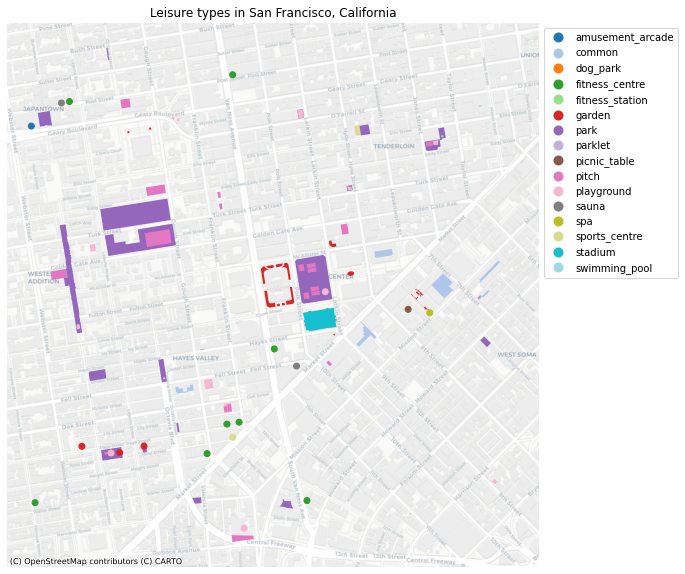

In [38]:
# Adding a basemap
# Looks like OSM doesn't have as many of the recreation areas as the SF dataset
ax = osm_web_mercator.plot(figsize=(10,10),
                            column='leisure',
                            cmap='tab20',
                            legend=True,
                            legend_kwds={'loc':'upper left','bbox_to_anchor':(1,1)})

ctx.add_basemap(ax,source=ctx.providers.CartoDB.Positron)

ax.set_title('Leisure types in ' + address)

ax.axis('off')

# Now to Make a Park Scatterplot

In [23]:
park['Latitude'] = park['Latitude'].astype(float)
park['Longitude'] = park['Longitude'].astype(float)
park.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 236 entries, 0 to 235
Data columns (total 33 columns):
 #   Column                 Non-Null Count  Dtype   
---  ------                 --------------  -----   
 0   OBJECTID               236 non-null    object  
 1   Map_Label              236 non-null    object  
 2   Longitude              236 non-null    float64 
 3   Latitude               236 non-null    float64 
 4   Acres                  236 non-null    object  
 5   TMA_PropertyID         236 non-null    object  
 6   GlobalID               236 non-null    object  
 7   created_user           236 non-null    object  
 8   created_date           236 non-null    object  
 9   last_edited_user       236 non-null    object  
 10  last_edited_date       236 non-null    object  
 11  SquareFeet             236 non-null    object  
 12  PerimeterLength        236 non-null    object  
 13  PropertyType           236 non-null    object  
 14  Address                236 non-nul

In [24]:
# The original data frame.
# Not sure what to do with the outlier but let's keep going
px.scatter(park,
           x='Longitude',
           y='Latitude',
          )

In [25]:
# Just the neighborhood parks and playgrounds
px.scatter(park_neighborhoodparks,
           x='Longitude',
           y='Latitude')

In [26]:
# Just the regional parks
px.scatter(park_regional,
           x='Longitude',
           y='Latitude')

In [27]:
# All recreation and parks. Looks great on a basemap (No issues with the outlier)
fig1 = px.scatter_mapbox(park,
                        lat='Latitude',
                        lon='Longitude',
                        mapbox_style="stamen-terrain")
fig1.show()

In [28]:
# Now to display each Recreation Space by Property Type
fig2 = px.scatter_mapbox(park, 
                        lat='Latitude', 
                        lon='Longitude', 
                        color='PropertyType'
                       )
fig2.update_layout(mapbox_style="carto-darkmatter")

fig2.show()

## Now I want to look at the top 3 Property Types: Neighborhood Parks, Regional Parks and Mini Parks

In [29]:
# I couldn't figure out how to trim the data itself into neighborhood parks, regional, and mini
# so I decided to make three seperate dataframes and merge them together
# First combining the neighborhood parks and regional parks
park_combined = park_regional.append(park_neighborhoodparks, ignore_index = True)

In [30]:
# Next, merging that combined dataframe with the mini parks
park_final = park_combined.append(park_mini, ignore_index = True)

In [31]:
# Scatterplot of the neighborhood parks and playgrounds, regional parks and mini parks
px.scatter(park_final,
           x='Longitude',
           y='Latitude')

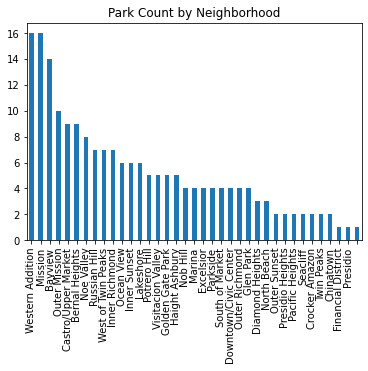

In [32]:
# Now that we have this new merged dataframe
# I wanted to make a chart showing the count of parks in each neighborhood 
park_final['Planning_Neighborhood'].value_counts().plot.bar(title="Park Count by Neighborhood")

In [33]:
px.bar(park_final, x=('Planning_Neighborhood'), 
       title='Number of Parks in San Francisco by Neighborhood',
       labels={'Planning_Neighborhood':'Neighborhood','count':'Count'})

In [34]:
# Converting Lat and Lon to float
park_final['Latitude'] = park_final['Latitude'].astype(float)
park_final['Longitude'] = park_final['Longitude'].astype(float)
park_final.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 196 entries, 0 to 195
Data columns (total 21 columns):
 #   Column                 Non-Null Count  Dtype   
---  ------                 --------------  -----   
 0   OBJECTID               196 non-null    object  
 1   Map_Label              196 non-null    object  
 2   Longitude              196 non-null    float64 
 3   Latitude               196 non-null    float64 
 4   Acres                  196 non-null    object  
 5   SquareFeet             196 non-null    object  
 6   PerimeterLength        196 non-null    object  
 7   PropertyType           196 non-null    object  
 8   Address                196 non-null    object  
 9   City                   196 non-null    object  
 10  State                  196 non-null    object  
 11  Zipcode                196 non-null    object  
 12  Complex                196 non-null    object  
 13  SupDist                196 non-null    object  
 14  Ownership              196 non-nul

In [35]:
# Now to display just the Neighborhood Parks, Regional Parks, Mini Parks
fig3 = px.scatter_mapbox(park_final, 
                        lat='Latitude', 
                        lon='Longitude', 
                        color='PropertyType'
                       )
fig3.update_layout(mapbox_style="carto-darkmatter")

fig3.show()

In [39]:
fig3.write_html("parks.html")

## Create an Interactive Map using Kepler

In [36]:
from keplergl import KeplerGl

In [37]:
map = KeplerGl(height=600,width=800)
map

User Guide: https://docs.kepler.gl/docs/keplergl-jupyter


KeplerGl(height=600)

In [38]:
# Couldn't get the park data to plot on Kepler so I decided to make a smaller subset
park_subset = park_final[['Map_Label','Latitude','Longitude','PropertyType']].copy()
park_subset.head()

,Map_Label,Latitude,Longitude,PropertyType
0,Lake Merced Park,37.721923,-122.492397,Regional Park
1,Mt. Davidson Park,37.739063,-122.454658,Regional Park
2,John McLaren Park,37.718084,-122.419078,Regional Park
3,Twin Peaks,37.752344,-122.446955,Regional Park
4,Sharp Park,37.623952,-122.474974,Regional Park


In [39]:
park_subset['Latitude'] = park_subset['Latitude'].astype(float)
park_subset['Longitude'] = park_subset['Longitude'].astype(float)
park_subset.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 196 entries, 0 to 195
Data columns (total 4 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   Map_Label     196 non-null    object 
 1   Latitude      196 non-null    float64
 2   Longitude     196 non-null    float64
 3   PropertyType  196 non-null    object 
dtypes: float64(2), object(2)
memory usage: 6.2+ KB


In [40]:
map.add_data(data=park_subset,name='Parks')

In [41]:
map.save_to_html(file_name='kepler_park_map.html')

Map saved to kepler_park_map.html!


### So the Kepler map for incident report isn't working for some reason in this notebook, but I was able to isolate the relevant lines of code and get it to work in a separate notebook. My kernel was also dying anytime I tried to implement changes to the map in this notebook. I'm wondering if along the way some of my code messed with the datatypes of the lat/long, but when I checked the data type of both they were still floats from when I converted it. 

In [ ]:
map.add_data(data=df_crime_combined,name='SF County Incident Reports')

# Contributions
Sara T. led the data exploration for the dataset on incident reports from the San Francisco Police Department. She queried the data from the data.sfgov.org API and created two datasets, which she then merged into one (df_crime_combined) which is explored in this notebook. She trimmed the larger dataframe into four mini dataframes representing incident reports across the four seasons. The several dataframes were then used to generate Geopandas plots and plotly charts. The combined dataframe was then used to generate the crime layer of the Kepler map which is in the accompanying Jupyter Notebook. She also spearheaded the presentation and accompanying slides.

Sarah D. led the data exploration for the dataset on recreation and parks from the City and County of San Francisco. She explored the data and made charts for property types, police districts and neighborhoods. She extracted the Neighborhood Parks and Playgrounds, Regional Parks and Mini Parks from the larger data set and merged them to create a new dataframe (park_final). She explored Open Street Maps to display "leisure" data in San Francisco in order to compare and contrast with the SF County data set. She also created the interactive scatterplot maps to see the main parks geographically across the city. The park_final dataframe was also use to generate the parks layer of the Kepler map which is in the accompanying Jupyter Notebook. Additionally, she merged the two jupyter notebooks together.